In [2]:
import sqlite3
import pandas as pd
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import hvplot.pandas
from sklearn.decomposition import PCA

# Connect to the SQLite database
conn = sqlite3.connect('Poverty_DB_test02.db')

# Load data from the "data_2022" table
data_2022 = pd.read_sql_query("SELECT * FROM data_2022", conn)

# Load data from the "API_Data" table
api_data = pd.read_sql_query("SELECT * FROM API_Data", conn)

# Close the database connection
conn.close()

In [4]:
# Display the structure of the data_2022 DataFrame
print("Data structure for data_2022:")
print(data_2022.info())

# Display the first few rows of the data_2022 DataFrame
print("\nFirst few rows of data_2022:")
print(data_2022.head())

# Display summary statistics of the data_2022 DataFrame
print("\nSummary statistics of data_2022:")
print(data_2022.describe())

# Similar operations for the api_data DataFrame
# Display the structure of the api_data DataFrame
print("Data structure for api_data:")
print(api_data.info())

# Display the first few rows of the api_data DataFrame
print("\nFirst few rows of api_data:")
print(api_data.head())

# Display summary statistics of the api_data DataFrame
print("\nSummary statistics of api_data:")
print(api_data.describe())

Data structure for data_2022:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50 entries, 0 to 49
Data columns (total 34 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   id                            50 non-null     int64  
 1   state_id                      50 non-null     int64  
 2   year                          50 non-null     int64  
 3   18-24_count                   50 non-null     float64
 4   18-24<hs_grad                 50 non-null     float64
 5   18-24_hs_grad/equiv           50 non-null     float64
 6   18-24_some_college/associate  50 non-null     float64
 7   18-24_bachelor/higher         50 non-null     float64
 8   25+_count                     50 non-null     float64
 9   25+<9th_grade                 50 non-null     float64
 10  25+_9th-12th_grade_nongrad    50 non-null     float64
 11  25+_hs_grad/equiv             50 non-null     float64
 12  25+_some_college              50 non

In [5]:
# Connect to the SQLite database
conn = sqlite3.connect('Poverty_DB_test02.db')

# Define the SQL query to select data from the tables
sql_query = """
SELECT *
FROM data_2010
UNION ALL
SELECT *
FROM data_2011
UNION ALL
SELECT *
FROM data_2012
UNION ALL
SELECT *
FROM data_2013
UNION ALL
SELECT *
FROM data_2014
UNION ALL
SELECT *
FROM data_2015
UNION ALL
SELECT *
FROM data_2016
UNION ALL
SELECT *
FROM data_2017
UNION ALL
SELECT *
FROM data_2018
UNION ALL
SELECT *
FROM data_2019
UNION ALL
SELECT *
FROM data_2021
UNION ALL
SELECT *
FROM data_2022;
"""

# Execute the SQL query and read the results into a DataFrame
combined_df = pd.read_sql_query(sql_query, conn)

# Close the database connection
conn.close()

# Display the shape of the combined DataFrame
print("Shape of combined DataFrame:", combined_df.shape)


Shape of combined DataFrame: (600, 34)


In [6]:
# Connect to the SQLite database
conn = sqlite3.connect('Poverty_DB_test02.db')

# Load data from the data_2010 to data_2022 tables
dfs = []
for year in range(2010, 2023):
    table_name = f'data_{year}'
    # Check if the table exists in the database
    query = f"SELECT name FROM sqlite_master WHERE type='table' AND name='{table_name}'"
    table_exists = conn.execute(query).fetchone()
    if table_exists:
        query = f'SELECT * FROM {table_name}'
        df = pd.read_sql_query(query, conn)
        dfs.append(df)

# Concatenate data from all available years into a single DataFrame
data = pd.concat(dfs, ignore_index=True)

# Close the database connection
conn.close()

# Display the first few rows of the data
print(data.head())
data

   id  state_id  year  18-24_count  18-24<hs_grad  18-24_hs_grad/equiv  \
0   1         1  2010     488349.0          0.199                0.301   
1   2         2  2010      75023.0          0.188                0.371   
2   3         3  2010     634568.0          0.196                0.307   
3   4         4  2010     291054.0          0.203                0.325   
4   5         5  2010    3944934.0          0.173                0.276   

   18-24_some_college/associate  18-24_bachelor/higher   25+_count  \
0                         0.439                  0.060   3161521.0   
1                         0.407                  0.034    450577.0   
2                         0.436                  0.060   4146758.0   
3                         0.415                  0.056   1919422.0   
4                         0.473                  0.078  24097200.0   

   25+<9th_grade  ...  45-64_bachelor/higher  65+_count  65+_hs_grad/higher  \
0          0.062  ...                  0.226   657974.0

,id,state_id,year,18-24_count,18-24<hs_grad,18-24_hs_grad/equiv,18-24_some_college/associate,18-24_bachelor/higher,25+_count,25+<9th_grade,...,45-64_bachelor/higher,65+_count,65+_hs_grad/higher,65+_bachelor/higher,25+_earnings,25+<hs_grad,25+_hs_grad/equiv.1,25+_some_college/associate,25+_bachelor's.1,25+>bachelor.1
0,1,1,2010,488349.0,0.199000,0.301000,0.439000,0.060000,3161521.0,0.062000,...,0.226000,657974.0,0.723000,0.167000,30406.0,17366.0,24849.0,30064.0,45502.0,52476.0
1,2,2,2010,75023.0,0.188000,0.371000,0.407000,0.034000,450577.0,0.028000,...,0.294000,53339.0,0.829000,0.244000,40575.0,20087.0,30617.0,40159.0,51137.0,67634.0
2,3,3,2010,634568.0,0.196000,0.307000,0.436000,0.060000,4146758.0,0.063000,...,0.274000,886795.0,0.837000,0.245000,32106.0,17638.0,25607.0,31751.0,46091.0,60051.0
3,4,4,2010,291054.0,0.203000,0.325000,0.415000,0.056000,1919422.0,0.063000,...,0.196000,420075.0,0.725000,0.152000,27498.0,18373.0,22895.0,27175.0,41102.0,54036.0
4,5,5,2010,3944934.0,0.173000,0.276000,0.473000,0.078000,24097200.0,0.105000,...,0.306000,4269495.0,0.766000,0.265000,35645.0,17937.0,27122.0,35735.0,52248.0,74423.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
595,46,46,2022,842750.0,0.094708,0.362341,0.393712,0.149239,5978782.0,0.035103,...,0.418254,1462042.0,0.880347,0.358564,55607.0,30436.0,39730.0,45135.0,73893.0,96914.0
596,47,47,2022,671550.0,0.127276,0.363541,0.351129,0.158054,5470209.0,0.035110,...,0.375339,1309142.0,0.927973,0.354521,59430.0,36000.0,42288.0,51740.0,76376.0,100613.0
597,48,48,2022,161047.0,0.108987,0.418530,0.365906,0.106578,1262566.0,0.034309,...,0.231959,376162.0,0.860055,0.206993,42738.0,26692.0,35052.0,40791.0,52887.0,63974.0
598,49,49,2022,562259.0,0.105667,0.371621,0.376791,0.145922,4088500.0,0.024324,...,0.318832,1102386.0,0.927381,0.274235,50039.0,35193.0,40104.0,45726.0,61428.0,75811.0


In [10]:
conn = sqlite3.connect('Poverty_DB_test02.db')
states_df = pd.read_sql_query("SELECT * FROM states", conn)
states_df

,id,state
0,1,Alabama
1,2,Alaska
2,3,Arizona
3,4,Arkansas
4,5,California
5,6,Colorado
6,7,Connecticut
7,8,Delaware
8,9,Florida
9,10,Georgia


Silhouette Plot: Plot silhouette scores for each sample to evaluate the quality of the clustering. Silhouette scores range from -1 to 1, where a score closer to 1 indicates better cluster separation.

Main 3 models start here:

ML predictive model attempt #1


In [3]:

# Connecting to grab consolidated table
db_filename = 'resources/Poverty_DB_test02.db'
conn = sqlite3.connect(db_filename)

# Create cursor to select
cursor = conn.cursor()
cursor.execute("SELECT * FROM all_clean_data")

# Get all rows
rows = cursor.fetchall()

# Get column names 
columns = [col[0] for col in cursor.description]

# Create DataFrame
df = pd.DataFrame(rows, columns=columns)

# Close connection
conn.close()

# Check df
print(df.head())


        state  year  median_h_income  poverty_rate  poverty_count 18-24_count  \
0     Alabama  2010            40538         0.189         883078     488,349   
1      Alaska  2010            63456         0.110          76850      75,023   
2     Arizona  2010            46787         0.176        1105075     634,568   
3    Arkansas  2010            38413         0.187         529710     291,054   
4  California  2010            57664         0.158        5785036   3,944,934   

   18-24<hs_grad  18-24_hs_grad/equiv  18-24_some_college/associate  \
0          0.199                0.301                         0.439   
1          0.188                0.371                         0.407   
2          0.196                0.307                         0.436   
3          0.203                0.325                         0.415   
4          0.173                0.276                         0.473   

   18-24_bachelor/higher  ... 25-34_bachelor/higher  35-44_count  \
0                 

In [4]:
# Set the combination of "year" and "state" as the index
# These cols are not needed as features
df.set_index(['year', 'state'], inplace=True)

# Check df
print(df.head())

                 median_h_income  poverty_rate  poverty_count 18-24_count  \
year state                                                                  
2010 Alabama               40538         0.189         883078     488,349   
     Alaska                63456         0.110          76850      75,023   
     Arizona               46787         0.176        1105075     634,568   
     Arkansas              38413         0.187         529710     291,054   
     California            57664         0.158        5785036   3,944,934   

                 18-24<hs_grad  18-24_hs_grad/equiv  \
year state                                            
2010 Alabama             0.199                0.301   
     Alaska              0.188                0.371   
     Arizona             0.196                0.307   
     Arkansas            0.203                0.325   
     California          0.173                0.276   

                 18-24_some_college/associate  18-24_bachelor/higher  \
ye

In [5]:
# Statistics
summary_statistics = df.describe()
print(summary_statistics)

       median_h_income  poverty_rate  poverty_count  18-24<hs_grad  \
count       600.000000    600.000000   6.000000e+02     600.000000   
mean      58534.156667      0.137768   8.930575e+05       0.133492   
std       12032.450744      0.031476   1.055749e+06       0.029078   
min       36963.000000      0.074000   5.577600e+04       0.063000   
25%       49203.000000      0.112000   2.368885e+05       0.114000   
50%       56804.000000      0.133000   6.085190e+05       0.130000   
75%       66355.750000      0.160000   9.421530e+05       0.152000   
max       96341.000000      0.239000   6.328064e+06       0.223000   

       18-24_hs_grad/equiv  18-24_some_college/associate  \
count           600.000000                    600.000000   
mean              0.320460                      0.444283   
std               0.039266                      0.037714   
min               0.220000                      0.322000   
25%               0.293750                      0.420000   
50%      

In [8]:
# Extra filter for numeric cols
numerical_columns = df.select_dtypes(include=['float64', 'int64']).columns

# Scale data
scaler = StandardScaler()

scaler.fit(df[numerical_columns])

scaled_data = scaler.transform(df[numerical_columns])

# New df to store scaled data
df_scaled = pd.DataFrame(scaled_data, columns=numerical_columns, index=df.index)
print(df_scaled.head())


                 median_h_income  poverty_rate  poverty_count  18-24<hs_grad  \
year state                                                                     
2010 Alabama           -1.496883      1.628994      -0.009460       2.254712   
     Alaska             0.409389     -0.882939      -0.773752       1.876106   
     Arizona           -0.977104      1.215638       0.200989       2.151456   
     Arkansas          -1.673636      1.565401      -0.344448       2.392387   
     California        -0.072378      0.643299       4.637522       1.359826   

                 18-24_hs_grad/equiv  18-24_some_college/associate  \
year state                                                           
2010 Alabama               -0.496003                     -0.140208   
     Alaska                 1.288180                     -0.989416   
     Arizona               -0.343073                     -0.219821   
     Arkansas               0.115717                     -0.777114   
     California    

In [9]:
# Create a list with the number of k-values from 1 to 11
k_values = list(range(1, 12))

Elbow Method for visual determination of best k value

In [10]:
# Create an empty list to store the inertia values
inertia_vals = []

# Create a for loop to compute the inertia with each possible value of k
for k in k_values:
# Inside the loop:
# 1. Create a KMeans model using the loop counter for the n_clusters
    kmeans = KMeans(n_clusters=k, random_state=42)  
# 2. Fit the model to the data using `df_market_data_scaled`
    kmeans.fit(df_scaled)
# 3. Append the model.inertia_ to the inertia list
    inertia_vals.append(kmeans.inertia_)
inertia_vals


c:\Users\trist\anaconda3\envs\dev\lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\trist\anaconda3\envs\dev\lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(
c:\Users\trist\anaconda3\envs\dev\lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\trist\anaconda3\envs\dev\lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak

[13200.0,
 8811.12186297636,
 7214.043220944157,
 6393.612936577952,
 5789.665905840131,
 5296.503100461434,
 4933.348266098413,
 4645.0448510313045,
 4383.808235036815,
 4195.139390974768,
 4020.627575033862]

In [11]:
# Create a dictionary with the data to plot the Elbow curve
elbow_dict = {
    'k_values': k_values,
    'inertia_values': inertia_vals
}


# Create a DataFrame with the data to plot the Elbow curve
df_elbow = pd.DataFrame(elbow_dict)
df_elbow.head()

,k_values,inertia_values
0,1,13200.000000
1,2,8811.121863
2,3,7214.043221
3,4,6393.612937
4,5,5789.665906


In [12]:
# Plot a line chart with all the inertia values computed with 
# the different values of k to visually identify the optimal value for k.
elbow_plot = df_elbow.hvplot.line(x='k_values', y='inertia_values', xlabel='Number of Clusters (k)', ylabel='Inertia', title='Elbow Curve', width=800, height=400)
elbow_plot

:Curve   [k_values]   (inertia_values)

From above elbow plot, k=3 is chosen

In [13]:
# Initialize the K-Means model using the best value for k
kmeans = KMeans(n_clusters=3, random_state=17)
kmeans

KMeans(n_clusters=3, random_state=17)

In [14]:
# Fit the K-Means model using the scaled data
kmeans.fit(df_scaled)

c:\Users\trist\anaconda3\envs\dev\lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\trist\anaconda3\envs\dev\lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(


KMeans(n_clusters=3, random_state=17)

In [15]:
# Predict the clusters to group the States-per-year 
clusters = kmeans.predict(df_scaled)

# Print the resulting array of cluster values.
clusters

array([1, 0, 1, 1, 1, 2, 2, 1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1, 0, 2, 2, 1,
       0, 1, 1, 0, 0, 1, 0, 2, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0,
       0, 2, 0, 1, 0, 0, 1, 0, 1, 1, 1, 2, 2, 1, 1, 1, 0, 1, 1, 1, 0, 0,
       1, 1, 0, 2, 2, 1, 0, 1, 1, 0, 0, 1, 0, 2, 1, 1, 1, 0, 1, 1, 0, 1,
       1, 1, 0, 1, 1, 0, 2, 2, 0, 1, 0, 0, 1, 0, 1, 1, 1, 2, 2, 0, 1, 1,
       0, 0, 0, 1, 0, 0, 1, 1, 0, 2, 2, 1, 0, 1, 1, 0, 0, 1, 0, 2, 1, 2,
       1, 0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 0, 2, 2, 0, 1, 0, 0, 1, 0, 1, 1,
       1, 2, 2, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 2, 2, 0, 0, 1, 1, 0,
       0, 1, 2, 2, 1, 2, 1, 0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 0, 2, 2, 0, 1,
       0, 0, 1, 0, 1, 1, 1, 2, 2, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 2,
       2, 0, 0, 1, 0, 0, 0, 1, 2, 2, 1, 2, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1,
       1, 0, 2, 2, 0, 1, 0, 0, 1, 0, 1, 1, 1, 2, 2, 0, 1, 1, 0, 0, 0, 1,
       0, 0, 1, 1, 0, 2, 2, 0, 0, 1, 0, 0, 0, 1, 2, 2, 1, 2, 1, 0, 0, 1,
       0, 0, 0, 1, 0, 1, 1, 0, 2, 2, 0, 1, 0, 0, 1,

In [16]:
# Create a copy of the DataFrame
df_copy_1 = df.copy()


In [17]:
# Add a new column to the DataFrame with the predicted clusters
df_copy_1['predicted_cluster'] = clusters


# Display sample data
df_copy_1.head()

median_h_income  poverty_rate  poverty_count 18-24_count  \
year state                                                                  
2010 Alabama               40538         0.189         883078     488,349   
     Alaska                63456         0.110          76850      75,023   
     Arizona               46787         0.176        1105075     634,568   
     Arkansas              38413         0.187         529710     291,054   
     California            57664         0.158        5785036   3,944,934   

                 18-24<hs_grad  18-24_hs_grad/equiv  \
year state                                            
2010 Alabama             0.199                0.301   
     Alaska              0.188                0.371   
     Arizona             0.196                0.307   
     Arkansas            0.203                0.325   
     California          0.173                0.276   

                 18-24_some_college/associate  18-24_bachelor/higher  \
year state                                                             
2010 Alabama                            0.439                  0.060   
     Alaska                             0.407                  0.034   
     Arizona                            0.436                  0.060   
     Arkansas                           0.415                  0.056   
     California                         0.473                  0.078   

                  25+_count  25+<9th_grade  ...  35-44_count  \
year state                                  ...                
2010 Alabama      3,161,521          0.062  ...      621,094   
     Alaska         450,577          0.028  ...       93,460   
     Arizona      4,146,758          0.063  ...      823,770   
     Arkansas     1,919,422          0.063  ...      371,843   
     California  24,097,200          0.105  ...    5,191,065   

                 35-44_hs_grad/higher  35-44_bachelor/higher  45-64_count  \
year state                                                                  
2010 Alabama                    0.854                  0.231    1,280,800   
     Alaska                     0.922                  0.307      200,088   
     Arizona                    0.850                  0.268    1,576,753   
     Arkansas                   0.862                  0.210      759,457   
     California                 0.797                  0.316    9,313,187   

                 45-64_hs_grad/higher  45-64_bachelor/higher  65+_count  \
year state                                                                
2010 Alabama                    0.851                  0.226    657,974   
     Alaska                     0.923                  0.294     53,339   
     Arizona                    0.873                  0.274    886,795   
     Arkansas                   0.854                  0.196    420,075   
     California                 0.819                  0.306  4,269,495   

                 65+_hs_grad/higher  65+_bachelor/higher predicted_cluster  
year state                                                                  
2010 Alabama                  0.723                0.167                 1  
     Alaska                   0.829                0.244                 0  
     Arizona                  0.837                0.245                 1  
     Arkansas                 0.725                0.152                 1  
     California               0.766                0.265                 1  

[5 rows x 29 columns]

Pulling a copy of just the relative columns for potential later use

In [18]:
educational_columns = ['25+<9th_grade', '25+_9th-12th_grade_nongrad', '25+_hs_grad/equiv', '25+_some_college', '25+_associate\'s', '25+_bachelor\'s', '25+>bachelor', 'poverty_rate']

# Create a new DataFrame containing only the selected columns
df_educational = df_copy_1[educational_columns]

# Display sample data
df_educational.head()

25+<9th_grade  25+_9th-12th_grade_nongrad  25+_hs_grad/equiv  \
year state                                                                      
2010 Alabama             0.062                       0.117              0.313   
     Alaska              0.028                       0.061              0.253   
     Arizona             0.063                       0.081              0.251   
     Arkansas            0.063                       0.107              0.346   
     California          0.105                       0.088              0.208   

                 25+_some_college  25+_associate's  25+_bachelor's  \
year state                                                           
2010 Alabama                0.218            0.071           0.139   
     Alaska                 0.296            0.082           0.185   
     Arizona                0.265            0.081           0.167   
     Arkansas               0.225            0.063           0.132   
     California             0.222            0.076           0.191   

                 25+>bachelor  poverty_rate  
year state                                   
2010 Alabama            0.080         0.189  
     Alaska             0.094         0.110  
     Arizona            0.092         0.176  
     Arkansas           0.063         0.187  
     California         0.110         0.158

In [20]:
# Grabbing just educational levels for multiple plot per attainment
educational_columns = ['25+<9th_grade', '25+_9th-12th_grade_nongrad', '25+_hs_grad/equiv', '25+_some_college', '25+_associate\'s', '25+_bachelor\'s', '25+>bachelor']

# Create a scatter plot for each education level with poverty rate
scatter_plots = []
for column in educational_columns:
    scatter_plot = df_copy_1.hvplot.scatter(x=column, y='poverty_rate', by='predicted_cluster', legend='bottom_right', width=400, height=300)
    scatter_plots.append(scatter_plot)

# Combine scatter plots
combined_plot = scatter_plots[0]  
for scatter_plot in scatter_plots[1:]:
    combined_plot += scatter_plot  

# Display
combined_plot


:Layout
   .NdOverlay.I   :NdOverlay   [predicted_cluster]
      :Scatter   [25+<9th_grade]   (poverty_rate)
   .NdOverlay.II  :NdOverlay   [predicted_cluster]
      :Scatter   [25+_9th-12th_grade_nongrad]   (poverty_rate)
   .NdOverlay.III :NdOverlay   [predicted_cluster]
      :Scatter   [25+_hs_grad/equiv]   (poverty_rate)
   .NdOverlay.IV  :NdOverlay   [predicted_cluster]
      :Scatter   [25+_some_college]   (poverty_rate)
   .NdOverlay.V   :NdOverlay   [predicted_cluster]
      :Scatter   [25+_associate's]   (poverty_rate)
   .NdOverlay.VI  :NdOverlay   [predicted_cluster]
      :Scatter   [25+_bachelor's]   (poverty_rate)
   .NdOverlay.VII :NdOverlay   [predicted_cluster]
      :Scatter   [25+>bachelor]   (poverty_rate)

Due to no direct accuracy measurement for this clustering method, employ 2 tests to quantify the quality of grouping by this model.

Background:

Davies-Bouldin Score
https://scikit-learn.org/stable/modules/generated/sklearn.metrics.davies_bouldin_score.html

"The score is defined as the average similarity measure of each cluster with its most similar cluster, where similarity is the ratio of within-cluster distances to between-cluster distances. Thus, clusters which are farther apart and less dispersed will result in a better score.

The minimum score is zero, with lower values indicating better clustering."

Sihouette Score
https://scikit-learn.org/stable/modules/generated/sklearn.metrics.silhouette_score.html

"The Silhouette Coefficient is calculated using the mean intra-cluster distance (a) and the mean nearest-cluster distance (b) for each sample. The Silhouette Coefficient for a sample is (b - a) / max(a, b). To clarify, b is the distance between a sample and the nearest cluster that the sample is not a part of. Note that Silhouette Coefficient is only defined if number of labels is 2 <= n_labels <= n_samples - 1.

This function returns the mean Silhouette Coefficient over all samples. To obtain the values for each sample, use silhouette_samples.

The best value is 1 and the worst value is -1. Values near 0 indicate overlapping clusters. Negative values generally indicate that a sample has been assigned to the wrong cluster, as a different cluster is more similar."

In [21]:
from sklearn.metrics import silhouette_score, davies_bouldin_score

# Calculate silhouette score
silhouette = silhouette_score(df_scaled, clusters)

# Calculate Davies-Bouldin index
davies_bouldin = davies_bouldin_score(df_scaled, clusters)

print("Silhouette Score:", silhouette)
print("Davies-Bouldin Index:", davies_bouldin)

Silhouette Score: 0.23295859887098844
Davies-Bouldin Index: 1.4597541457848553


Scores are not strong for this clustering model using k=3

Next attempt uses k=2 

Intuitively, poverty outcomes could be classified into two groups: in poverty and above poverty

In [22]:
# Second attempt with n=2
# Initialize the K-Means model using the best value for k
kmeans = KMeans(n_clusters=2, random_state=17)
kmeans

KMeans(n_clusters=2, random_state=17)

In [23]:
# Fit the K-Means model using the scaled data
kmeans.fit(df_scaled)

c:\Users\trist\anaconda3\envs\dev\lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\trist\anaconda3\envs\dev\lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(


KMeans(n_clusters=2, random_state=17)

In [24]:
# Predict the clusters with new KMeans
clusters = kmeans.predict(df_scaled)

# Print the resulting array of cluster values.
clusters

array([1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1,
       0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0,
       0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0, 0,
       1, 1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0, 1, 1, 1,
       0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1, 0, 0, 1, 1,
       1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1, 1, 0, 1, 1,
       1, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 0,
       0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 1,
       0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0, 1, 1, 0, 0,
       0, 1, 0, 1, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 1, 1, 0, 1,
       1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 1,
       0, 0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1,
       0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 1,

In [25]:
# Create a new copy of the DataFrame
df_copy_2 = df.copy()


In [26]:
# Add a new column to the DataFrame with the predicted clusters
df_copy_2['predicted_cluster'] = clusters


# Display sample data
df_copy_2.head()

median_h_income  poverty_rate  poverty_count 18-24_count  \
year state                                                                  
2010 Alabama               40538         0.189         883078     488,349   
     Alaska                63456         0.110          76850      75,023   
     Arizona               46787         0.176        1105075     634,568   
     Arkansas              38413         0.187         529710     291,054   
     California            57664         0.158        5785036   3,944,934   

                 18-24<hs_grad  18-24_hs_grad/equiv  \
year state                                            
2010 Alabama             0.199                0.301   
     Alaska              0.188                0.371   
     Arizona             0.196                0.307   
     Arkansas            0.203                0.325   
     California          0.173                0.276   

                 18-24_some_college/associate  18-24_bachelor/higher  \
year state                                                             
2010 Alabama                            0.439                  0.060   
     Alaska                             0.407                  0.034   
     Arizona                            0.436                  0.060   
     Arkansas                           0.415                  0.056   
     California                         0.473                  0.078   

                  25+_count  25+<9th_grade  ...  35-44_count  \
year state                                  ...                
2010 Alabama      3,161,521          0.062  ...      621,094   
     Alaska         450,577          0.028  ...       93,460   
     Arizona      4,146,758          0.063  ...      823,770   
     Arkansas     1,919,422          0.063  ...      371,843   
     California  24,097,200          0.105  ...    5,191,065   

                 35-44_hs_grad/higher  35-44_bachelor/higher  45-64_count  \
year state                                                                  
2010 Alabama                    0.854                  0.231    1,280,800   
     Alaska                     0.922                  0.307      200,088   
     Arizona                    0.850                  0.268    1,576,753   
     Arkansas                   0.862                  0.210      759,457   
     California                 0.797                  0.316    9,313,187   

                 45-64_hs_grad/higher  45-64_bachelor/higher  65+_count  \
year state                                                                
2010 Alabama                    0.851                  0.226    657,974   
     Alaska                     0.923                  0.294     53,339   
     Arizona                    0.873                  0.274    886,795   
     Arkansas                   0.854                  0.196    420,075   
     California                 0.819                  0.306  4,269,495   

                 65+_hs_grad/higher  65+_bachelor/higher predicted_cluster  
year state                                                                  
2010 Alabama                  0.723                0.167                 1  
     Alaska                   0.829                0.244                 1  
     Arizona                  0.837                0.245                 1  
     Arkansas                 0.725                0.152                 1  
     California               0.766                0.265                 1  

[5 rows x 29 columns]

In [27]:
# Similar method as iteration 1:
educational_columns = ['25+<9th_grade', '25+_9th-12th_grade_nongrad', '25+_hs_grad/equiv', '25+_some_college', '25+_associate\'s', '25+_bachelor\'s', '25+>bachelor']

# Create a scatter plot for each education level
scatter_plots = []
for column in educational_columns:
    scatter_plot = df_copy_2.hvplot.scatter(x=column, y='poverty_rate', by='predicted_cluster', legend='bottom_right', width=400, height=300)
    scatter_plots.append(scatter_plot)

# Combine scatter plots 
combined_plot = scatter_plots[0]  
for scatter_plot in scatter_plots[1:]:
    combined_plot += scatter_plot  

# Display
combined_plot


:Layout
   .NdOverlay.I   :NdOverlay   [predicted_cluster]
      :Scatter   [25+<9th_grade]   (poverty_rate)
   .NdOverlay.II  :NdOverlay   [predicted_cluster]
      :Scatter   [25+_9th-12th_grade_nongrad]   (poverty_rate)
   .NdOverlay.III :NdOverlay   [predicted_cluster]
      :Scatter   [25+_hs_grad/equiv]   (poverty_rate)
   .NdOverlay.IV  :NdOverlay   [predicted_cluster]
      :Scatter   [25+_some_college]   (poverty_rate)
   .NdOverlay.V   :NdOverlay   [predicted_cluster]
      :Scatter   [25+_associate's]   (poverty_rate)
   .NdOverlay.VI  :NdOverlay   [predicted_cluster]
      :Scatter   [25+_bachelor's]   (poverty_rate)
   .NdOverlay.VII :NdOverlay   [predicted_cluster]
      :Scatter   [25+>bachelor]   (poverty_rate)

In [28]:
# Calculate silhouette score
silhouette = silhouette_score(df_scaled, clusters)

# Calculate Davies-Bouldin index
davies_bouldin = davies_bouldin_score(df_scaled, clusters)

print("Silhouette Score:", silhouette)
print("Davies-Bouldin Index:", davies_bouldin)

Silhouette Score: 0.28391466493140577
Davies-Bouldin Index: 1.3212071351921844


Iteration 1 (k=3):

Silhouette Score: 0.23295859887098844

Davies-Bouldin Index: 1.4597541457848553

Iteration 2 (k=2):

Silhouette Score: 0.28391466493140577

Davies-Bouldin Index: 1.3212071351921844

Iteration 2 is a slightly optimized version, although both clustering models have poor scores



Silhouette method can be used to compute an optimal k value.

Background:

https://scikit-learn.org/stable/auto_examples/cluster/plot_kmeans_silhouette_analysis.html



In [31]:
# Alternate method for optimizing k
from sklearn.metrics import silhouette_score
from sklearn.cluster import KMeans
import numpy as np
# Silhouette Method
silhouette_scores = []
for k in range(2, 12):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(df_scaled)
    silhouette_scores.append(silhouette_score(df_scaled, kmeans.labels_))

# Find the value of k that maximizes the silhouette score (Add 2 because range starts from 2)
optimal_k_silhouette = np.argmax(silhouette_scores) + 2  

print("Optimal k (Silhouette Method):", optimal_k_silhouette)



c:\Users\trist\anaconda3\envs\dev\lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\trist\anaconda3\envs\dev\lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(
c:\Users\trist\anaconda3\envs\dev\lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\trist\anaconda3\envs\dev\lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak

Optimal k (Silhouette Method): 2


So optimal k for best silhouette method is 2.

Optimization via changing number of clusters is complete.

To further optimize, PCA can reduce dimensionality of the data.

Background:
PCA (Principal Component Analysis)
https://scikit-learn.org/stable/modules/generated/sklearn.decomposition.PCA.html

"Linear dimensionality reduction using Singular Value Decomposition of the data to project it to a lower dimensional space. The input data is centered but not scaled for each feature before applying the SVD.

It uses the LAPACK implementation of the full SVD or a randomized truncated SVD by the method of Halko et al. 2009, depending on the shape of the input data and the number of components to extract.

With sparse inputs, the ARPACK implementation of the truncated SVD can be used (i.e. through scipy.sparse.linalg.svds). Alternatively, one may consider TruncatedSVD where the data are not centered."

In [32]:
# Initialize PCA with 3 components
pca = PCA(n_components=3) 

# Fit PCA 
pca_transformed = pca.fit_transform(df_scaled)

# Perform clustering
kmeans = KMeans(n_clusters=optimal_k_silhouette, random_state=42)
kmeans.fit(pca_transformed)

c:\Users\trist\anaconda3\envs\dev\lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\trist\anaconda3\envs\dev\lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(


KMeans(n_clusters=2, random_state=42)

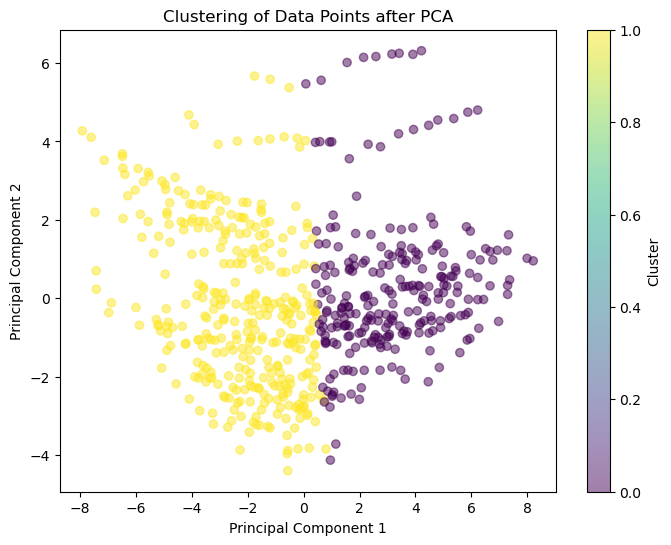

In [33]:
# Scatter plot of PCA 
plt.figure(figsize=(8, 6))
plt.scatter(pca_transformed[:, 0], pca_transformed[:, 1], c=kmeans.labels_, cmap='viridis', alpha=0.5)
plt.title('Clustering of Data Points after PCA')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.colorbar(label='Cluster')
plt.show()

In [80]:
# Calculate silhouette score
silhouette = silhouette_score(pca_transformed, kmeans.labels_)
print("Silhouette Score:", silhouette)

# Calculate Davies-Bouldin score
davies_bouldin = davies_bouldin_score(pca_transformed, kmeans.labels_)
print("Davies-Bouldin Score:", davies_bouldin)

Silhouette Score: 0.3698063928979558
Davies-Bouldin Score: 1.0190035163754716


Although this clustering is of a higher quality, complexity and nuance present in real world poverty and edicational attainment data may be lost.

For the sake of better model performance, this does improve scores, however, it becomes more difficult to draw conclusions with this iteration.

In [34]:
# Data check
df_scaled.head()

median_h_income  poverty_rate  poverty_count  18-24<hs_grad  \
year state                                                                     
2010 Alabama           -1.496883      1.628994      -0.009460       2.254712   
     Alaska             0.409389     -0.882939      -0.773752       1.876106   
     Arizona           -0.977104      1.215638       0.200989       2.151456   
     Arkansas          -1.673636      1.565401      -0.344448       2.392387   
     California        -0.072378      0.643299       4.637522       1.359826   

                 18-24_hs_grad/equiv  18-24_some_college/associate  \
year state                                                           
2010 Alabama               -0.496003                     -0.140208   
     Alaska                 1.288180                     -0.989416   
     Arizona               -0.343073                     -0.219821   
     Arkansas               0.115717                     -0.777114   
     California            -1.133211                      0.762076   

                 18-24_bachelor/higher  25+<9th_grade  \
year state                                              
2010 Alabama                 -1.322097       1.214229   
     Alaska                  -2.144258      -0.936902   
     Arizona                 -1.322097       1.277498   
     Arkansas                -1.448583       1.277498   
     California              -0.752909       3.934777   

                 25+_9th-12th_grade_nongrad  25+_hs_grad/equiv  ...  \
year state                                                      ...   
2010 Alabama                       2.673292           0.685269  ...   
     Alaska                       -0.316808          -0.831466  ...   
     Arizona                       0.751085          -0.882024  ...   
     Arkansas                      2.139346           1.519474  ...   
     California                    1.124847          -1.969017  ...   

                 25+_bachelor's  25+>bachelor  25-34_hs_grad/higher  \
year state                                                            
2010 Alabama          -1.689821     -1.187015             -2.719623   
     Alaska           -0.178118     -0.705048              0.279512   
     Arizona          -0.769654     -0.773901             -2.057024   
     Arkansas         -1.919862     -1.772260             -1.568792   
     California        0.019061     -0.154229             -2.824244   

                 25-34_bachelor/higher  35-44_hs_grad/higher  \
year state                                                     
2010 Alabama                 -1.245595             -1.528016   
     Alaska                  -1.288951              0.631499   
     Arizona                 -1.404570             -1.655046   
     Arkansas                -1.577997             -1.273955   
     California              -0.392910             -3.338198   

                 35-44_bachelor/higher  45-64_hs_grad/higher  \
year state                                                     
2010 Alabama                 -1.738164             -1.544875   
     Alaska                  -0.565449              0.723139   
     Arizona                 -1.167237             -0.851870   
     Arkansas                -2.062204             -1.450374   
     California              -0.426575             -2.552881   

                 45-64_bachelor/higher  65+_hs_grad/higher  \
year state                                                   
2010 Alabama                 -1.354707           -2.301596   
     Alaska                  -0.083413           -0.303132   
     Arizona                 -0.457323           -0.152304   
     Arkansas                -1.915572           -2.263889   
     California               0.140933           -1.490898   

                 65+_bachelor/higher  
year state                            
2010 Alabama               -1.653282  
     Alaska                -0.263969  
     Arizona               -0.245926  
     Arkansas              -1.923927  
  

Running a train_test_split model with the highest quality kmeans model.

Background:

train_test_split https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.train_test_split

"Split arrays or matrices into random train and test subsets.

Quick utility that wraps input validation, next(ShuffleSplit().split(X, y)), and application to input data into a single call for splitting (and optionally subsampling) data into a one-liner."

In [82]:
# Separate the y variable (target variable, labels) using the cluster labels obtained from clustering
y = kmeans.labels_  

# Separate the X variable (features) using the original features (scaled) before PCA or clustering
X = df_scaled  

In [83]:
# Import the train_test_learn module
from sklearn.model_selection import train_test_split

# Split the data using train_test_split

# Assign a random_state of 1 to the function

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=1)

print(X_train, X_test, y_train, y_test)

ValueError: Found input variables with inconsistent numbers of samples: [154, 600]

Run logistic regression model on the split data.

Background:

Logistic Regression Model (LRM) https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LogisticRegression

"Logistic Regression (aka logit, MaxEnt) classifier.

In the multiclass case, the training algorithm uses the one-vs-rest (OvR) scheme if the ‘multi_class’ option is set to ‘ovr’, and uses the cross-entropy loss if the ‘multi_class’ option is set to ‘multinomial’. (Currently the ‘multinomial’ option is supported only by the ‘lbfgs’, ‘sag’, ‘saga’ and ‘newton-cg’ solvers.)

This class implements regularized logistic regression using the ‘liblinear’ library, ‘newton-cg’, ‘sag’, ‘saga’ and ‘lbfgs’ solvers. Note that regularization is applied by default. It can handle both dense and sparse input. Use C-ordered arrays or CSR matrices containing 64-bit floats for optimal performance; any other input format will be converted (and copied).

The ‘newton-cg’, ‘sag’, and ‘lbfgs’ solvers support only L2 regularization with primal formulation, or no regularization. The ‘liblinear’ solver supports both L1 and L2 regularization, with a dual formulation only for the L2 penalty. The Elastic-Net regularization is only supported by the ‘saga’ solver."

Confusion Matrix https://scikit-learn.org/stable/modules/generated/sklearn.metrics.confusion_matrix.html

https://www.evidentlyai.com/classification-metrics/confusion-matrix

"A confusion matrix is a table that summarizes the performance of a classification model by comparing its predicted labels to the true labels. It displays the number of true positives (TP), true negatives (TN), false positives (FP), and false negatives (FN) of the model's predictions."

Classification Report https://scikit-learn.org/stable/modules/generated/sklearn.metrics.classification_report

"Text summary of the precision, recall, F1 score for each class."


In [37]:
# Import the LogisticRegression module from SKLearn
from sklearn.linear_model import LogisticRegression

# Instantiate the Logistic Regression model
# Assign a random_state parameter of 1 to the model
LRM = LogisticRegression(random_state=1)


# Fit the model using training data
LRM.fit(X_train, y_train)

LogisticRegression(random_state=1)

In [38]:
# Make a prediction using the testing data
prediction = LRM.predict(X_test)

In [40]:
from sklearn.metrics import confusion_matrix, classification_report
# Generate a confusion matrix for the model
c_matrix = confusion_matrix(y_test, prediction)
c_matrix

array([[72,  1],
       [ 2, 75]], dtype=int64)

In [41]:
# Print the classification report for the model
class_report = classification_report(y_test, prediction)
class_report

'              precision    recall  f1-score   support\n\n           0       0.97      0.99      0.98        73\n           1       0.99      0.97      0.98        77\n\n    accuracy                           0.98       150\n   macro avg       0.98      0.98      0.98       150\nweighted avg       0.98      0.98      0.98       150\n'

For class 0:

Precision: 0.97

Recall: 0.99

F1-score: 0.98

Support: 73



For class 1:

Precision: 0.99

Recall: 0.97

F1-score: 0.98

Support: 77

Overall model performance metrics:

Accuracy: 0.98

Macro average precision, recall, and F1-score: 0.98

Weighted average precision, recall, and F1-score: 0.98

This LRM has a high accuracy of classification. In the attempt to classify states-per-year into two classes of poverty rate, the classification from this model would be accurate 98% of the time. This is, however, after optimizing KMeans, and reducing dimensionality.

In [43]:
# Setting relevant variables for visualizations 

# Predicted Labels (y_pred)
y_pred = prediction

# True Labels (y_true)
y_true = y_test

# Predicted Probabilities (y_pred_prob)
y_pred_prob = LRM.predict_proba(X_test)[:, 1] 

# Feature Matrix (X)
X = X_test

# Logistic Regression Model (model)
model = LRM


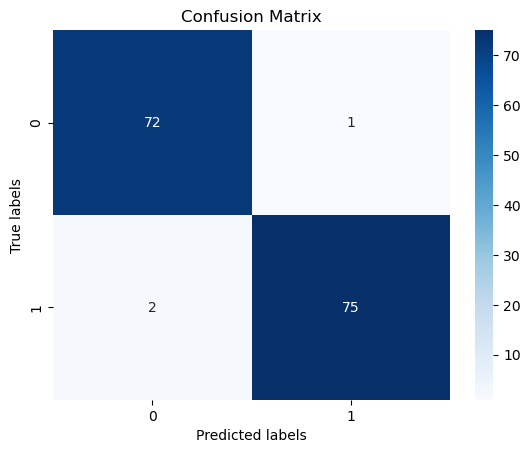

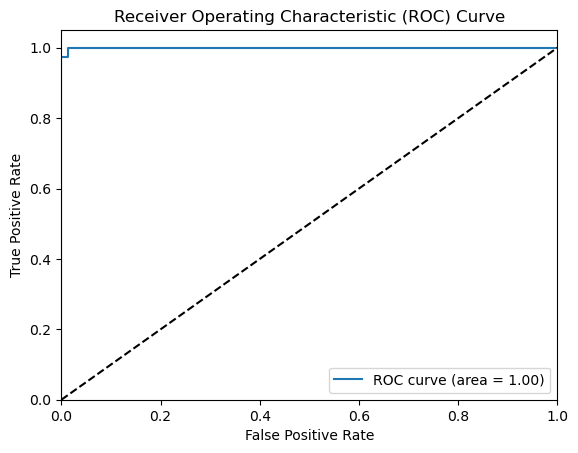

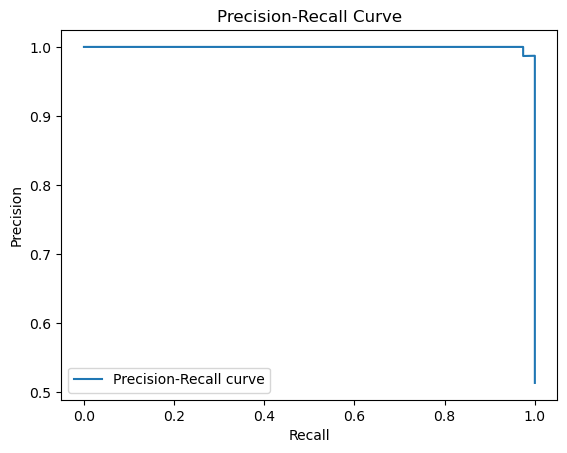

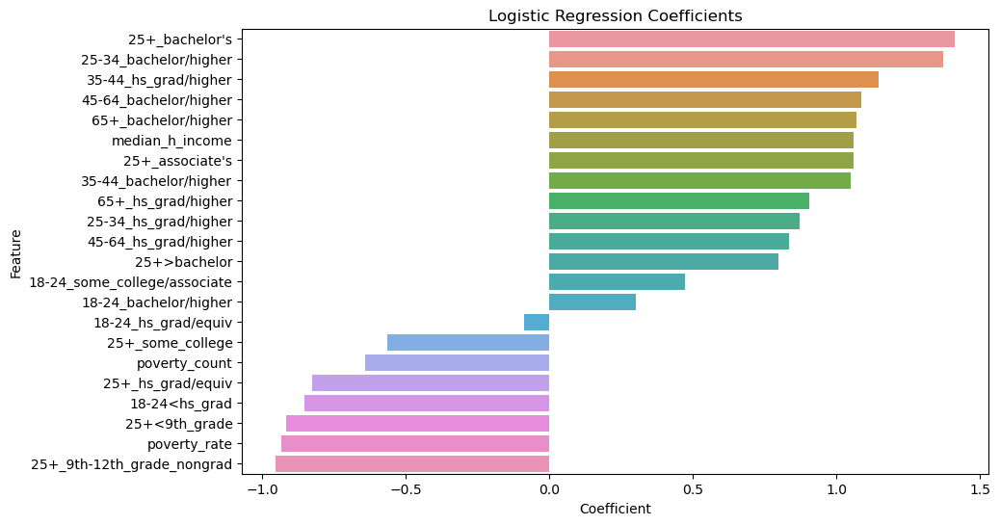

In [44]:
from sklearn.metrics import confusion_matrix, roc_curve, precision_recall_curve, roc_auc_score
import matplotlib.pyplot as plt
import seaborn as sns

# Confusion Matrix plot for nice visual of CM
conf_matrix = confusion_matrix(y_true, y_pred)
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix')
plt.show()

# ROC Curve (Not useful)
#fpr, tpr, thresholds = roc_curve(y_true, y_pred_prob)
#plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc_score(y_true, y_pred_prob))
#plt.plot([0, 1], [0, 1], 'k--')
#plt.xlim([0.0, 1.0])
#plt.ylim([0.0, 1.05])
#plt.xlabel('False Positive Rate')
#plt.ylabel('True Positive Rate')
#plt.title('Receiver Operating Characteristic (ROC) Curve')
#plt.legend(loc='lower right')
#plt.show()

# Precision-Recall Curve (Not useful)
#precision, recall, thresholds = precision_recall_curve(y_true, y_pred_prob)
#plt.plot(recall, precision, label='Precision-Recall curve')
#plt.xlabel('Recall')
#plt.ylabel('Precision')
#plt.title('Precision-Recall Curve')
#plt.legend(loc='lower left')
#plt.show()

# Coefficients Plot to aid in visualizing the weights each feature has on the classification
coefficients = pd.DataFrame({'Feature': X.columns, 'Coefficient': model.coef_[0]})
coefficients = coefficients.sort_values(by='Coefficient', ascending=False)
plt.figure(figsize=(10, 6))
sns.barplot(x='Coefficient', y='Feature', data=coefficients)
plt.xlabel('Coefficient')
plt.ylabel('Feature')
plt.title('Logistic Regression Coefficients')
plt.show()


In [59]:
# Now that we are informed by unsupervised model with tweaks, starting new supervised model that has manually selected features

df_scaled.head()

median_h_income  poverty_rate  poverty_count  18-24<hs_grad  \
year state                                                                     
2010 California        -0.072378      0.643299       4.637522       1.359826   
     Florida           -1.176482      0.865875       2.043442       1.910525   
     Idaho             -1.270556      0.643299      -0.615288       0.843545   
     Illinois          -0.463065      0.007366       0.795427       0.637033   
     Indiana           -1.157683      0.484316       0.063842       2.254712   

                 18-24_hs_grad/equiv  18-24_some_college/associate  \
year state                                                           
2010 California            -1.133211                      0.762076   
     Florida               -0.394050                     -0.352510   
     Idaho                  0.319624                     -0.034057   
     Illinois              -1.158700                      0.178245   
     Indiana               -0.394050                     -0.617887   

                 18-24_bachelor/higher  25+<9th_grade  \
year state                                              
2010 California              -0.752909       3.934777   
     Florida                 -0.816152       0.897886   
     Idaho                   -1.100746      -0.051142   
     Illinois                 0.638439       0.834618   
     Indiana                 -0.816152      -0.051142   

                 25+_9th-12th_grade_nongrad  25+_hs_grad/equiv  ...  \
year state                                                      ...   
2010 California                    1.124847          -1.969017  ...   
     Florida                       1.124847           0.331365  ...   
     Idaho                         0.430717           0.002739  ...   
     Illinois                      0.430717          -0.250051  ...   
     Indiana                       1.124847           1.873379  ...   

                 25+>bachelor  25-34_hs_grad/higher  25-34_bachelor/higher  \
year state                                                                   
2010 California     -0.154229             -2.824244              -0.392910   
     Florida        -0.773901             -1.743160              -1.129976   
     Idaho          -1.290293             -0.452835              -1.563545   
     Illinois        0.017902             -0.836445               0.517585   
     Indiana        -1.152589             -1.220055              -0.942096   

                 35-44_hs_grad/higher  35-44_bachelor/higher  \
year state                                                     
2010 California             -3.338198              -0.426575   
     Florida                -0.765834              -1.043793   
     Idaho                  -0.289470              -0.935780   
     Illinois               -0.416501               0.051769   
     Indiana                -0.225955              -1.336972   

                 45-64_hs_grad/higher  45-64_bachelor/higher  \
year state                                                     
2010 California             -2.552881               0.140933   
     Florida                -0.788870              -0.569496   
     Idaho                  -0.253367              -0.756451   
     Illinois               -0.379367               0.122237   
     Indiana                -0.158866              -1.261230   

                 65+_hs_grad/higher  65+_bachelor/higher  poverty_category  
year state                                                                  
2010 California           -1.490898             0.114934                 1  
     Florida              -0.793321            -0.516572                 1  
     Idaho                -0.076891            -1.111991                 1  
     Illinois             -1.057269            -1.039819                 0  
     Indiana              -1.000709            -2.014142                 0  

[5 rows x 23 columns]

If poverty rate is placed into two bins manually, a model can be run to predict which bin (low poverty rate 0, or high poverty rate 1) states-per-year fall into

In [84]:
# Check the range of poverty_rate and try just 2 bins
# Check the range of poverty_rate column and find a good median for bin separation 
print("Minimum Poverty Rate:", df_scaled['poverty_rate'].min())
print("Maximum Poverty Rate:", df_scaled['poverty_rate'].max())
print("Bin separation:", ((df_scaled['poverty_rate'].max()) - df_scaled['poverty_rate'].min()) / 2 )

Minimum Poverty Rate: 0.007366218898424887
Maximum Poverty Rate: 0.9930616973926101
Bin separation: 0.4928477392470926


In [85]:
# Define the threshold for binning
threshold = 0.493  

# Bin the poverty_rate variable into 'low poverty rate' and 'high poverty rate'
df_scaled['poverty_category'] = pd.cut(df_scaled['poverty_rate'], bins=[0, threshold, 1], labels=['low poverty rate', 'high poverty rate'])

# Map 'low poverty rate' to 0 and 'high poverty rate' to 1
category_mapping = {'low poverty rate': 0, 'high poverty rate': 1}
df_scaled['poverty_category'] = df_scaled['poverty_category'].map(category_mapping)

# Display the first few rows to verify the result
print(df_scaled.head())


                 median_h_income  poverty_rate  poverty_count  18-24<hs_grad  \
year state                                                                     
2010 California        -0.072378      0.643299       4.637522       1.359826   
     Florida           -1.176482      0.865875       2.043442       1.910525   
     Idaho             -1.270556      0.643299      -0.615288       0.843545   
     Illinois          -0.463065      0.007366       0.795427       0.637033   
     Indiana           -1.157683      0.484316       0.063842       2.254712   

                 18-24_hs_grad/equiv  18-24_some_college/associate  \
year state                                                           
2010 California            -1.133211                      0.762076   
     Florida               -0.394050                     -0.352510   
     Idaho                  0.319624                     -0.034057   
     Illinois              -1.158700                      0.178245   
     Indiana       

In [86]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report

# Select x features and y target
X = df_scaled.drop(columns=['poverty_rate', 'poverty_category'])  
y = df_scaled['poverty_category']  

# Split Data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Choose Model
model = LogisticRegression()

# Train Model
model.fit(X_train, y_train)

# Predictions
y_pred = model.predict(X_test)

# Evaluate Model
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)
print("\nClassification Report:")
print(classification_report(y_test, y_pred))


Accuracy: 0.9032258064516129

Classification Report:
              precision    recall  f1-score   support

           0       0.84      1.00      0.91        16
           1       1.00      0.80      0.89        15

    accuracy                           0.90        31
   macro avg       0.92      0.90      0.90        31
weighted avg       0.92      0.90      0.90        31



Binning the data manually, selecting the features and keeping the complexity of the original data, a reasonable accuracy of 90% is achieved by this model.

Below, generated with a long run time, is a pairplot that shows how well classification occurs for this model per feature in the entire data set

c:\Users\trist\anaconda3\envs\dev\lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


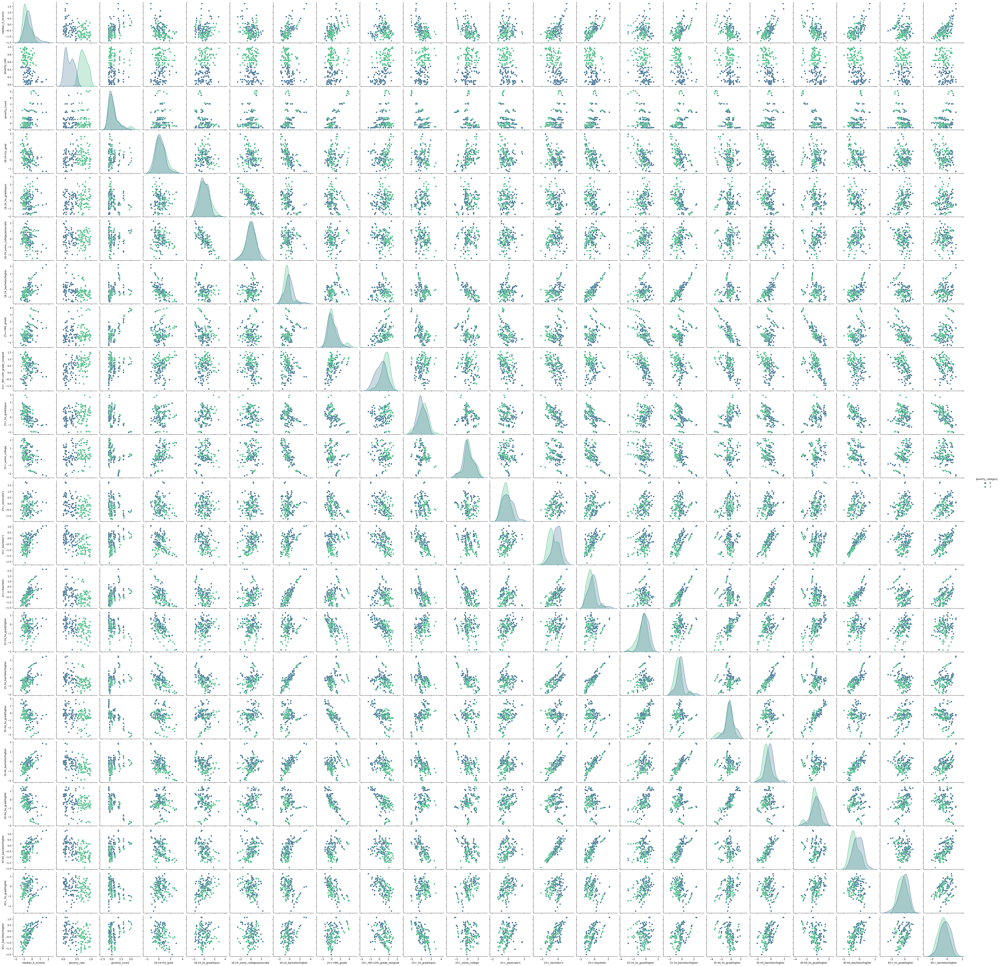

In [87]:
import seaborn as sns
# full feature pairplot... dont run this, runtime is > 4 mins
# Create pairplot
sns.pairplot(df_scaled, hue='poverty_category', palette='viridis')
plt.show()


From the above plot, it is clear that poverty rate can be binned and separated better

Narrowing features could improve this model. Running an implementation of this model where only the 25+ age group is selected in an attempt to reduce confusion. Most household incomes are likely to be comprised of mainly individuals over the age of 25.

In [88]:
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report


# Select relevant features related to education attainment in the 25+ age group
features = ['25+<9th_grade', '25+_9th-12th_grade_nongrad', '25+_hs_grad/equiv', '25+_some_college', '25+_associate\'s', '25+_bachelor\'s', '25+>bachelor']

X = df_scaled[features]  
y = df_scaled['poverty_category']  

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize and train the logistic regression model
model = LogisticRegression()
model.fit(X_train, y_train)

# Make predictions
y_pred = model.predict(X_test)

# Evaluate the model's performance
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)
print("\nClassification Report:")
print(classification_report(y_test, y_pred))


Accuracy: 0.8387096774193549

Classification Report:
              precision    recall  f1-score   support

           0       0.82      0.88      0.85        16
           1       0.86      0.80      0.83        15

    accuracy                           0.84        31
   macro avg       0.84      0.84      0.84        31
weighted avg       0.84      0.84      0.84        31



Accuracy is actually REDUCED when selecting features in this way

Since poverty rate is a continuous decimal percentage in the original data without binning, a linear regression model may be a better fit.

Background:

Linear Regression Model https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LinearRegression.html

"LinearRegression fits a linear model with coefficients w = (w1, …, wp) to minimize the residual sum of squares between the observed targets in the dataset, and the targets predicted by the linear approximation."

In [91]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score

# Extract the target variable (poverty_rate) and features
y = df_scaled['poverty_rate']
X = df_scaled.drop(columns=['poverty_rate', 'poverty_category'])  

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize and train the linear regression model
lin_reg = LinearRegression()
lin_reg.fit(X_train, y_train)

# Make predictions
y_pred = lin_reg.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print("Mean Squared Error:", mse)
print("R^2 Score:", r2)


Mean Squared Error: 0.04965509510557076
R^2 Score: 0.5285464319036028


On relative scales, with 0.0 being lowest MSE and 1 being highest R^2, this model has decent performance for predicting poverty rate from the original data set, but not outstanding performance. Variance in the original data set is to be expected. Educational attainment does not always account for poverty outcomes.

Implementing a Neural Network for higher accuracy in predicting poverty rate in this complex data set may be useful.

In [67]:
# Pre-scaled data check

df.head()

median_h_income  poverty_rate  poverty_count 18-24_count  \
year state                                                                  
2010 Alabama               40538         0.189         883078     488,349   
     Alaska                63456         0.110          76850      75,023   
     Arizona               46787         0.176        1105075     634,568   
     Arkansas              38413         0.187         529710     291,054   
     California            57664         0.158        5785036   3,944,934   

                 18-24<hs_grad  18-24_hs_grad/equiv  \
year state                                            
2010 Alabama             0.199                0.301   
     Alaska              0.188                0.371   
     Arizona             0.196                0.307   
     Arkansas            0.203                0.325   
     California          0.173                0.276   

                 18-24_some_college/associate  18-24_bachelor/higher  \
year state                                                             
2010 Alabama                            0.439                  0.060   
     Alaska                             0.407                  0.034   
     Arizona                            0.436                  0.060   
     Arkansas                           0.415                  0.056   
     California                         0.473                  0.078   

                  25+_count  25+<9th_grade  ...  25-34_bachelor/higher  \
year state                                  ...                          
2010 Alabama      3,161,521          0.062  ...                  0.248   
     Alaska         450,577          0.028  ...                  0.245   
     Arizona      4,146,758          0.063  ...                  0.237   
     Arkansas     1,919,422          0.063  ...                  0.225   
     California  24,097,200          0.105  ...                  0.307   

                 35-44_count  35-44_hs_grad/higher  35-44_bachelor/higher  \
year state                                                                  
2010 Alabama         621,094                 0.854                  0.231   
     Alaska           93,460                 0.922                  0.307   
     Arizona         823,770                 0.850                  0.268   
     Arkansas        371,843                 0.862                  0.210   
     California    5,191,065                 0.797                  0.316   

                 45-64_count  45-64_hs_grad/higher 45-64_bachelor/higher  \
year state                                                                 
2010 Alabama       1,280,800                 0.851                 0.226   
     Alaska          200,088                 0.923                 0.294   
     Arizona       1,576,753                 0.873                 0.274   
     Arkansas        759,457                 0.854                 0.196   
     California    9,313,187                 0.819                 0.306   

                 65+_count  65+_hs_grad/higher 65+_bachelor/higher  
year state                                                          
2010 Alabama       657,974               0.723               0.167  
     Alaska         53,339               0.829               0.244  
     Arizona       886,795               0.837               0.245  
     Arkansas      420,075               0.725               0.152  
     California  4,269,495               0.766               0.265  

[5 rows x 28 columns]

Neural Network Model:

TensorFlow is a deep learning module that may improve performance.
Background: https://www.tensorflow.org/learn

Sequential Model https://www.tensorflow.org/guide/keras/sequential_model

"A Sequential model is appropriate for a plain stack of layers where each layer has exactly one input tensor and one output tensor."

Dropout Layer https://www.tensorflow.org/api_docs/python/tf/keras/layers/Dropout

"The Dropout layer randomly sets input units to 0 with a frequency of rate at each step during training time, which helps prevent overfitting. Inputs not set to 0 are scaled up by 1 / (1 - rate) such that the sum over all inputs is unchanged."

Rectified Linear Unit (ReLu) Activation Function https://builtin.com/machine-learning/relu-activation-function

"The rectified linear unit (ReLU) or rectifier activation function introduces the property of nonlinearity to a deep learning model and solves the vanishing gradients issue. It interprets the positive part of its argument. It is one of the most popular activation functions in deep learning."

Linear Activation Function https://www.v7labs.com/blog/neural-networks-activation-functions

"The linear activation function, also known as "no activation," or "identity function" (multiplied x1.0), is where the activation is proportional to the input.

The function doesn't do anything to the weighted sum of the input, it simply spits out the value it was given."

ADAM Optimizer https://machinelearningmastery.com/adam-optimization-algorithm-for-deep-learning/

"Adam is an optimization algorithm that can be used instead of the classical stochastic gradient descent procedure to update network weights iterative based in training data."

In [69]:
!pip install tensorflow
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout

# Reformatting for datatypes since we have reverted to original data
df = df.apply(lambda x: x.str.replace(',', '').astype(float) if x.dtype == 'object' else x)

# Split the data into features (X) and target variable (y)
X = df.drop(columns=["poverty_rate"])
y = df["poverty_rate"]

# Scaling
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

# Build the neural network model
# Sequential model with 2 dense relu layers, separated by a dropout layer, and the linear layer serves as output
model = Sequential([
    Dense(64, activation='relu', input_shape=(X_train.shape[1],)),
    Dropout(0.2),
    Dense(32, activation='relu'),
    Dense(1, activation='linear')
])

# Compile the model with ADAM
model.compile(optimizer='adam', loss='mean_squared_error', metrics=['mae'])

# Train the model
history = model.fit(X_train, y_train, epochs=50, batch_size=32, validation_split=0.2)

# Evaluate the model
loss, mae = model.evaluate(X_test, y_test)
print("Mean Absolute Error:", mae)

  Obtaining dependency information for tensorflow from https://files.pythonhosted.org/packages/e2/46/a26598fab7da99dbe3a564f90cb4bba8de9ceb8943ff9180cd9789b5f6ea/tensorflow-2.16.1-cp310-cp310-win_amd64.whl.metadata
  Obtaining dependency information for tensorflow-intel==2.16.1 from https://files.pythonhosted.org/packages/f1/32/05a56ab12d5601b5399e64b8f875362fb59c99218a5e74a99364a58516be/tensorflow_intel-2.16.1-cp310-cp310-win_amd64.whl.metadata
  Obtaining dependency information for absl-py>=1.0.0 from https://files.pythonhosted.org/packages/a2/ad/e0d3c824784ff121c03cc031f944bc7e139a8f1870ffd2845cc2dd76f6c4/absl_py-2.1.0-py3-none-any.whl.metadata
  Obtaining dependency information for astunparse>=1.6.0 from https://files.pythonhosted.org/packages/2b/03/13dde6512ad7b4557eb792fbcf0c653af6076b81e5941d36ec61f7ce6028/astunparse-1.6.3-py2.py3-none-any.whl.metadata
  Obtaining dependency information for flatbuffers>=23.5.26 from https://files.pythonhosted.org/packages/41/f0/7e988a019bc54b2db

c:\Users\trist\anaconda3\envs\dev\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


12/12 ━━━━━━━━━━━━━━━━━━━━ 2s 43ms/step - loss: 0.2387 - mae: 0.3997 - val_loss: 0.0698 - val_mae: 0.1937
Epoch 2/50
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0759 - mae: 0.1989 - val_loss: 0.0207 - val_mae: 0.1182
Epoch 3/50
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0526 - mae: 0.1669 - val_loss: 0.0191 - val_mae: 0.1101
Epoch 4/50
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0405 - mae: 0.1435 - val_loss: 0.0150 - val_mae: 0.0978
Epoch 5/50
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0255 - mae: 0.1241 - val_loss: 0.0138 - val_mae: 0.0918
Epoch 6/50
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0248 - mae: 0.1169 - val_loss: 0.0107 - val_mae: 0.0841
Epoch 7/50
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0199 - mae: 0.1086 - val_loss: 0.0085 - val_mae: 0.0759
Epoch 8/50
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0202 - mae: 0.1038 - val_loss: 0.0082 - val_mae: 0.0742
Epoch 9/50
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0160 - mae: 0.0935 - v

Relatively low error for this NN model after 50 epochs:

Mean Absolute Error: 0.022204197943210602

Prediction vs Actual

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


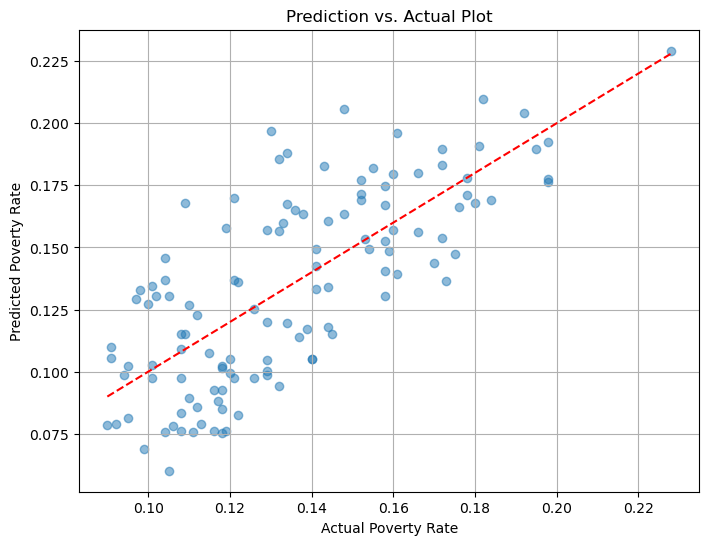

In [71]:
import matplotlib.pyplot as plt

# Make predictions on the test data
predictions = model.predict(X_test).flatten()

plt.figure(figsize=(8, 6))
plt.scatter(y_test, predictions, alpha=0.5)
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], '--', color='red')  # Diagonal line
plt.xlabel('Actual Poverty Rate')
plt.ylabel('Predicted Poverty Rate')
plt.title('Prediction vs. Actual Plot')
plt.grid(True)
plt.show()



Residual plot

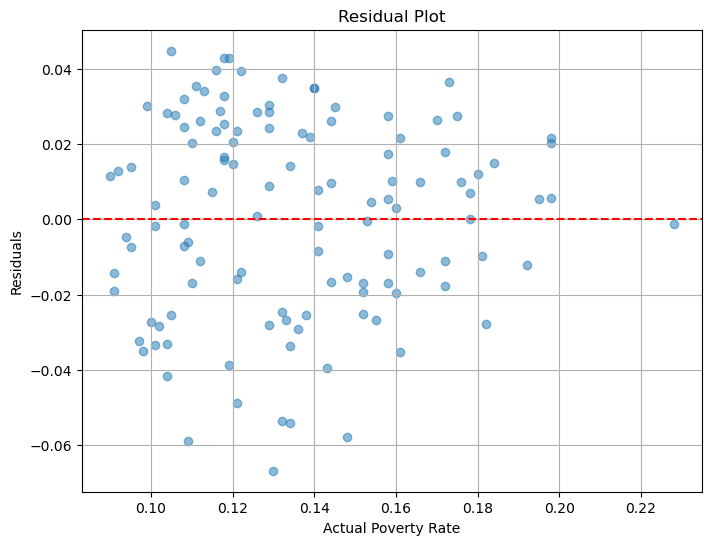

In [72]:
residuals = y_test - predictions

plt.figure(figsize=(8, 6))
plt.scatter(y_test, residuals, alpha=0.5)
plt.axhline(y=0, color='red', linestyle='--')  # Horizontal line at y=0
plt.xlabel('Actual Poverty Rate')
plt.ylabel('Residuals')
plt.title('Residual Plot')
plt.grid(True)
plt.show()


Learning Curve

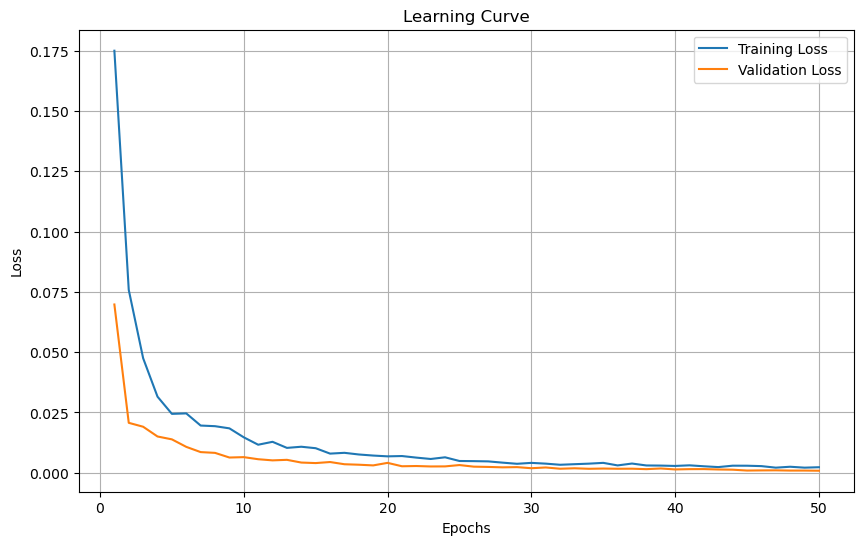

In [76]:
epochs = range(1, len(history.history['loss']) + 1)

plt.figure(figsize=(10, 6))
plt.plot(epochs, history.history['loss'], label='Training Loss')
plt.plot(epochs, history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Learning Curve')
plt.legend()
plt.grid(True)
plt.show()


Distribution Plot

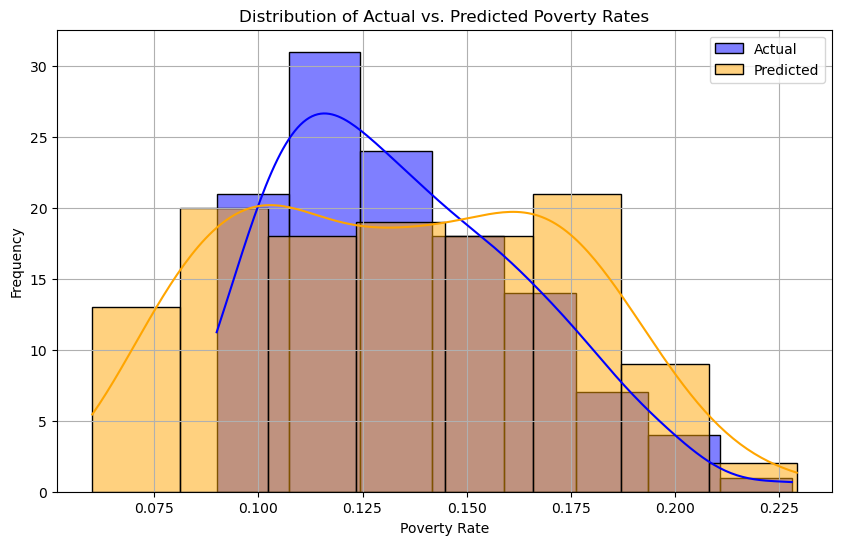

In [77]:
import seaborn as sns

plt.figure(figsize=(10, 6))
sns.histplot(y_test, color='blue', label='Actual', kde=True)
sns.histplot(predictions, color='orange', label='Predicted', kde=True)
plt.xlabel('Poverty Rate')
plt.ylabel('Frequency')
plt.title('Distribution of Actual vs. Predicted Poverty Rates')
plt.legend()
plt.grid(True)
plt.show()


Feature Distribution

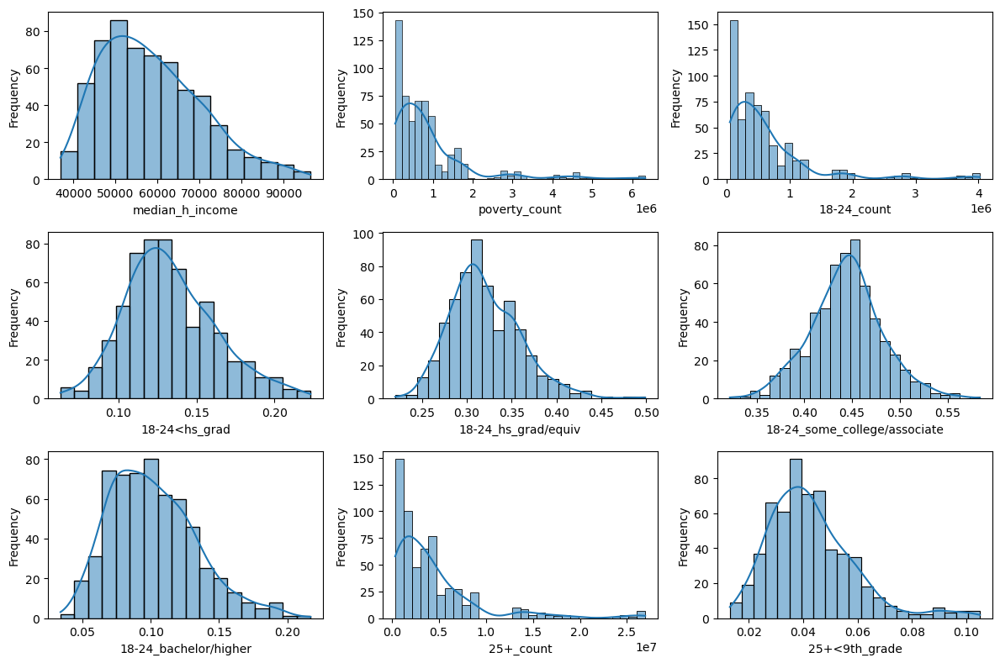

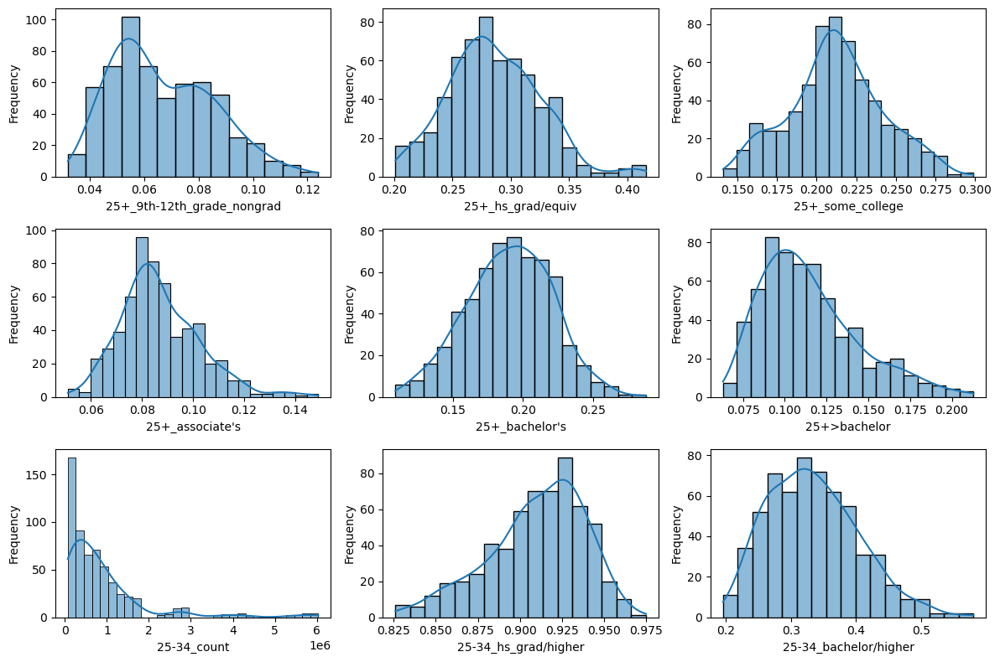

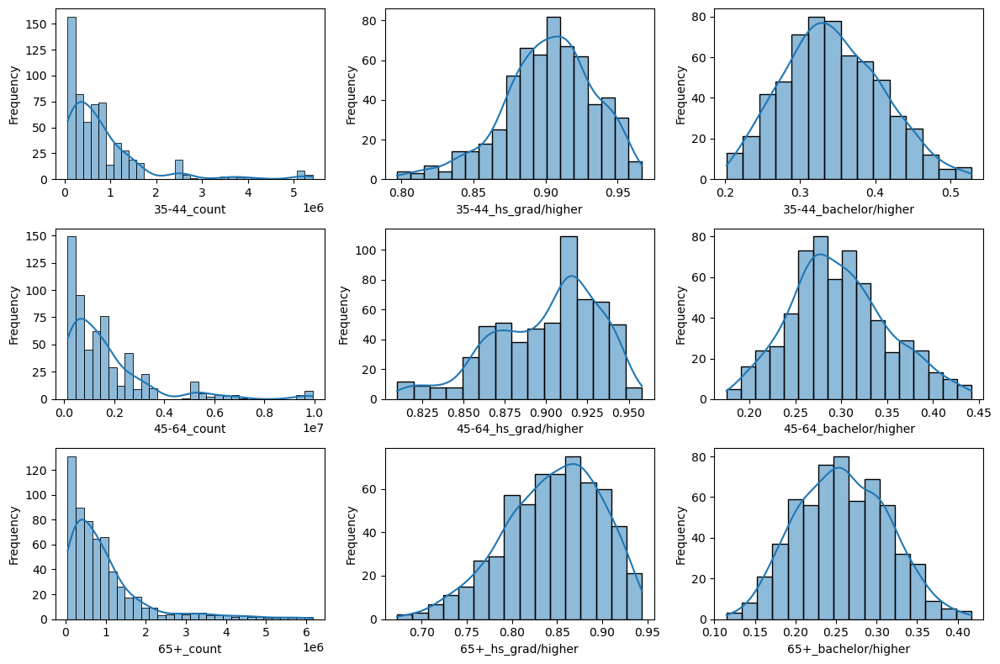

In [79]:
plt.figure(figsize=(12, 8))
num_plots = len(X.columns)
rows = 3
cols = 3
for i, feature in enumerate(X.columns):
    plt.subplot(rows, cols, i % (rows * cols) + 1)
    sns.histplot(X[feature], kde=True)
    plt.xlabel(feature)
    plt.ylabel('Frequency')
    if (i + 1) % (rows * cols) == 0 or i == num_plots - 1:
        plt.tight_layout()
        plt.show()
        if i != num_plots - 1:
            plt.figure(figsize=(12, 8))

